In [9]:
from pattern_creation import get_adjustments_to_use, get_pattern_style, get_pattern_img_by_style
from apply_pattern import get_pattern_mask
import json
from pathlib import Path
import numpy as np
from PIL import Image

In [2]:
with open('./config.json') as config_file:
    config = json.load(config_file)

In [3]:
available_patterns = [pt.name.strip(pt.suffix) for pt in Path('../../22_andere_daten/patterns/').glob('./*.tif')]

row = {
    'use_blow_up_centered': False,
    'use_blow_up_region': False,
    'use_contract_centered': False,
    'use_contract_region': False,
    'use_pillow_disortion': False,
    'use_roll': False,
    'use_rotation': True,
    'use_scale': False,
    'use_stretch': False,
    'use_trapezoidal_distortion': False,
    'use_uniform_trapezoidal_distortion': False,
    'use_wave_deform': False,
    'pattern': '',
    'rotation_degree': 48,
    'creation_date' : None,
    'tile_out' : None,
    'pattern_out': None,
    'screen_out' : None,
    'ssim' : None
}

rows = []

for pt in available_patterns:
    next_row = row.copy()
    next_row['pattern'] = pt
    next_row['tile_out'] = f'{pt}.tile.jpg'
    next_row['pattern_out'] = f'{pt}.pattern.jpg'
    next_row['screen_out'] = f'{pt}.screen.jpg'

    
    rows.append(
        next_row
    )

In [14]:
config['pattern_mask']['mask_decrease_factor']

0.9

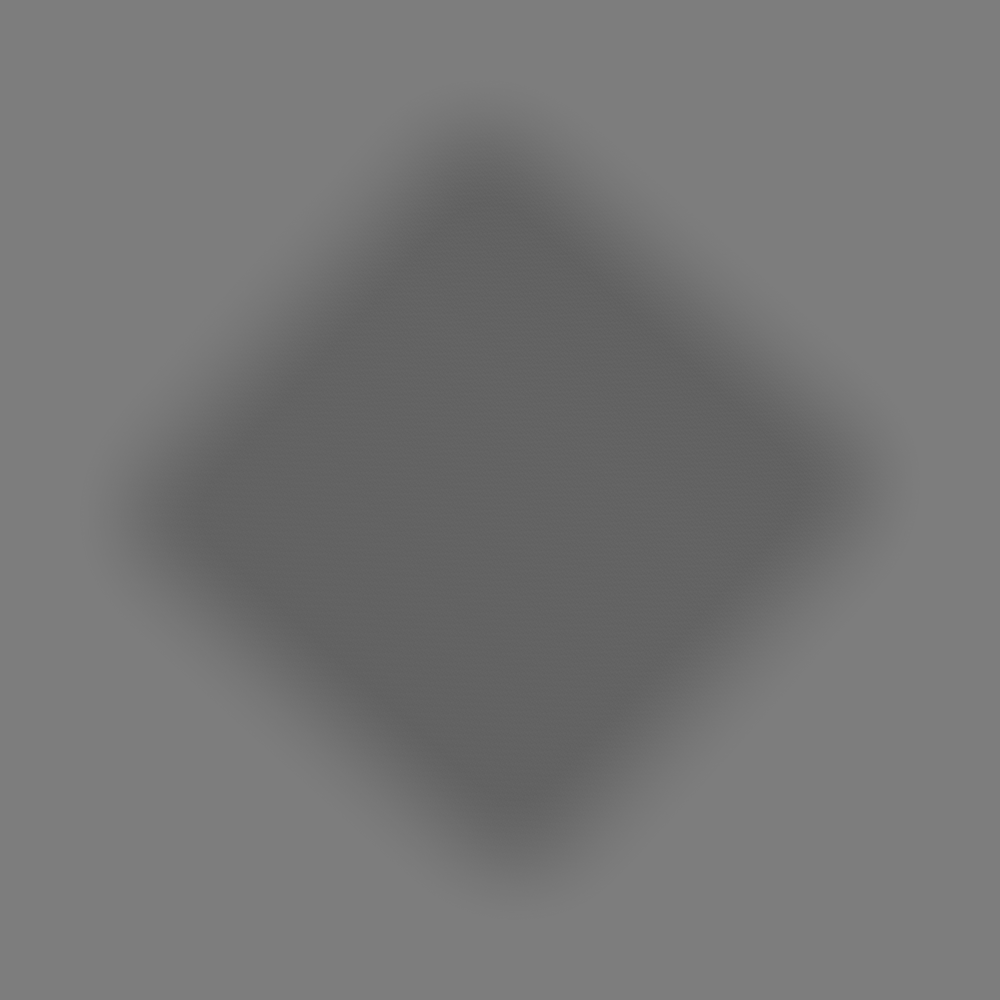

In [41]:
pattern_img = get_pattern_img_by_style(rows[5], config)
neutral_gray = Image.fromarray( (np.ones( pattern_img.size ) * 125).astype('uint8') )

pattern_mask = get_pattern_mask(
    np.array(pattern_img),
    config['pattern_mask']['thumb_sizes'],
    0.78,
    config['pattern_mask']['per_size_blur_radius_factor'],
    config['pattern_mask']['composite_blur_radius_factor'],
    config['pattern_mask']['increase_contrast_factor'],
)
pattern_mask = np.array(pattern_mask) / 255

out = np.array(pattern_img) * pattern_mask + np.array(neutral_gray) * (1 - pattern_mask)
out_img = Image.fromarray(out.round().astype('uint8'))
out_img